
<a name='toc'></a>  TOC

* <a href='#me.01.t1'> Modeling and Evaluation 1</a> :
            Train and adjust parameters  
            
  - <a href='#spectral'>SpectralClustering</a>
  - <a href='#end_of_file'> end of file</a>


In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#%matplotlib inline
import warnings
warnings.simplefilter('ignore',DeprecationWarning)
import seaborn as sns
import time
import copy

from pylab import rcParams
#import hdbscan

from sklearn.model_selection import ShuffleSplit
from sklearn.preprocessing import StandardScaler

#from sklearn.datasets import make_blobs

from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score

from sklearn import metrics
from sklearn import metrics as mt
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import confusion_matrix as conf
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support as score

from sklearn.cluster import KMeans

from tabulate import tabulate

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from __future__ import print_function

#### Read in cleaned  dataset from .csv file  

In [54]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in cleaned data set
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 'mashable_clean_dataset_for_lab_03.csv'

file_2_read = data_dir + data_file
df = pd.read_csv(file_2_read)

df_cluster = copy.deepcopy(df)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... add 'popular' binary based 'shares' values
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_cluster['shares'] = np.exp(df_cluster['ln_shares'])
df_cluster['popular'] = np.where(df_cluster['shares'] > 1400, 1, 0)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in t-SNE vectors
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 't_sne_mapping_perplex_0100.csv'

file_2_read = data_dir + data_file
df_tsne = pd.read_csv(file_2_read)

df_tsne.head()


# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... join t-sne vectors with base data, since we sampled to create
# ...     the t-sne mapping
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_join = df_tsne.join(df_cluster, on = 'sample_index')

df_join.head()


,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,global_subjectivity,global_rate_positive_words,rate_positive_words,...,ln_self_reference_avg_sharess,ln_LDA_00,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares
0,0.757447,-1.164821,0,1,0,-0.112902,0,0.670593,0.346403,0.457827,...,-0.139965,1.320242,1.235123,-0.643623,-0.631127,-0.692339,-0.266190,0.100486,0.248162,-1.171081
1,-0.661657,-1.688626,0,0,0,-0.112902,0,-0.875228,0.201534,0.269096,...,-2.032745,2.255159,-0.413498,-0.597044,-0.592009,-0.647786,-0.080881,-0.937038,-0.740381,-0.976042
2,-0.661657,-0.641015,0,0,0,-0.112902,0,2.218418,0.989601,0.920026,...,0.047434,0.248240,-0.510740,-0.674579,-0.666507,1.573640,-0.660825,0.100486,-0.740381,-0.173712
3,-0.661657,-0.117210,0,1,0,-0.112902,0,-0.115874,0.103648,-0.081405,...,-2.032745,-0.619381,1.412882,1.105693,-0.686387,-0.744975,0.386392,0.640207,-0.740381,-0.413529
4,1.230482,-0.117210,0,0,0,-0.112902,0,0.601046,2.008329,0.936179,...,0.423196,-0.619083,-0.537434,-0.696925,-0.687885,2.111239,-0.412983,-0.937038,-0.005038,-1.343719


,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,global_subjectivity,global_rate_positive_words,rate_positive_words,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,0.757447,-1.164821,0,1,0,-0.112902,0,0.670593,0.346403,0.457827,...,1.235123,-0.643623,-0.631127,-0.692339,-0.266190,0.100486,0.248162,-1.171081,0.310032,0
1,-0.661657,-1.688626,0,0,0,-0.112902,0,-0.875228,0.201534,0.269096,...,-0.413498,-0.597044,-0.592009,-0.647786,-0.080881,-0.937038,-0.740381,-0.976042,0.376799,0
2,-0.661657,-0.641015,0,0,0,-0.112902,0,2.218418,0.989601,0.920026,...,-0.510740,-0.674579,-0.666507,1.573640,-0.660825,0.100486,-0.740381,-0.173712,0.840539,0
3,-0.661657,-0.117210,0,1,0,-0.112902,0,-0.115874,0.103648,-0.081405,...,1.412882,1.105693,-0.686387,-0.744975,0.386392,0.640207,-0.740381,-0.413529,0.661312,0
4,1.230482,-0.117210,0,0,0,-0.112902,0,0.601046,2.008329,0.936179,...,-0.537434,-0.696925,-0.687885,2.111239,-0.412983,-0.937038,-0.005038,-1.343719,0.260874,0


,x-tsne,y-tsne,sample_index
0,13.380795,10.659998,6972
1,-9.200704,3.382056,11092
2,-29.567352,-1.899089,10229
3,-3.023949,21.598028,1319
4,-14.161682,-6.246559,29199


,x-tsne,y-tsne,sample_index,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,13.380795,10.659998,6972,-0.661657,-1.688626,0,1,0,-0.348014,0,...,2.852511,-0.597480,-0.591652,-0.647785,0.099159,0.100486,1.591996,-0.507042,0.602275,0
1,-9.200704,3.382056,11092,-2.080761,-0.641015,0,0,0,0.972211,0,...,-0.510734,-0.674533,-0.666230,-0.723204,-0.348173,-0.937038,-0.740381,0.736897,2.089441,0
2,-29.567352,-1.899089,10229,-0.188622,-0.641015,0,0,0,0.402518,1,...,2.428048,-0.674663,0.109347,-0.723205,-1.553284,-1.481184,0.543219,-1.131931,0.322410,0
3,-3.023949,21.598028,1319,0.757447,-1.688626,0,0,1,-1.646262,0,...,-0.407681,-0.595744,-0.591331,-0.637070,1.941572,-0.937038,-0.551762,1.368603,3.929857,0
4,-14.161682,-6.246559,29199,0.757447,0.406595,0,0,0,-0.369743,0,...,-0.559803,1.972443,-0.703975,-0.276279,-0.104558,0.100486,-0.740381,-0.247860,0.780469,0


<a href='#toc'> Table of Contents</a>

<a name='spectral'></a>
<font color="blue" size=3>Spectral

### spectral clustering


In [55]:
# set required variables for model comparison

spc_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

i_index = []
i_index = 0

# preparation for cross validation and model comparison, each classifier is appended once model is fit

models = []




### Spectral Clustering on the t-SNE 2-D mapping  



n_clusters =  2


/home/mcdevitt/anaconda3/lib/python3.6/site-packages/sklearn/manifold/spectral_embedding_.py:234: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


array([0, 0, 1, ..., 0, 0, 0], dtype=int32)

silhouette =  0.304340314215
n_clusters = 2


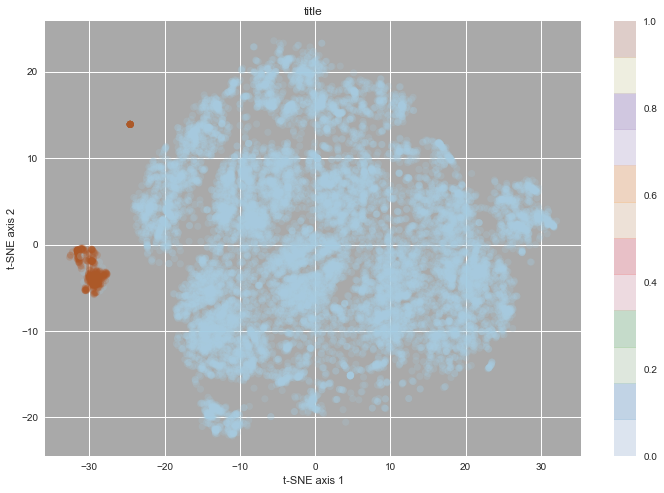

n_clusters =  3


array([0, 1, 1, ..., 1, 1, 1], dtype=int32)

silhouette =  0.256634227345
n_clusters = 3


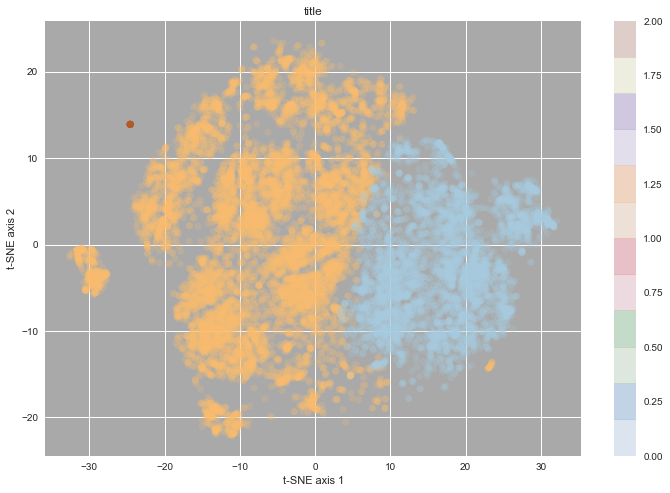

n_clusters =  4


array([0, 2, 1, ..., 2, 2, 1], dtype=int32)

silhouette =  0.271795458331
n_clusters = 4


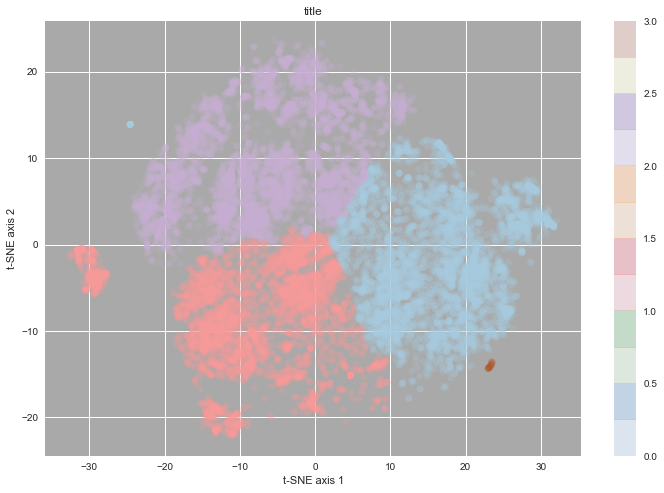

n_clusters =  5


array([0, 4, 2, ..., 4, 4, 2], dtype=int32)

silhouette =  0.347794130791
n_clusters = 5


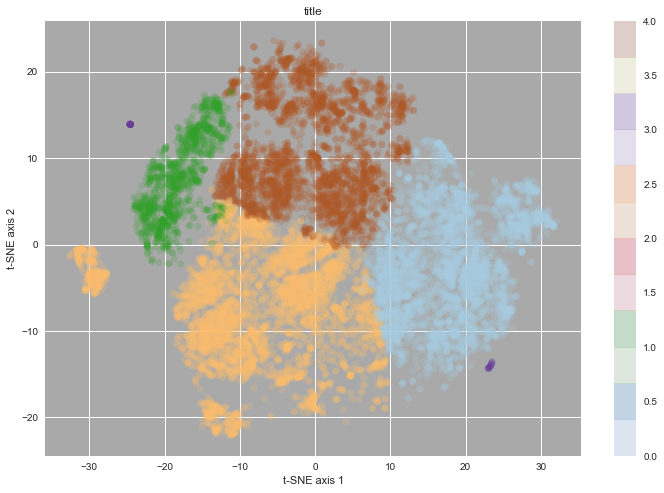

n_clusters =  6


array([4, 0, 5, ..., 0, 0, 1], dtype=int32)

silhouette =  0.368793420967
n_clusters = 6


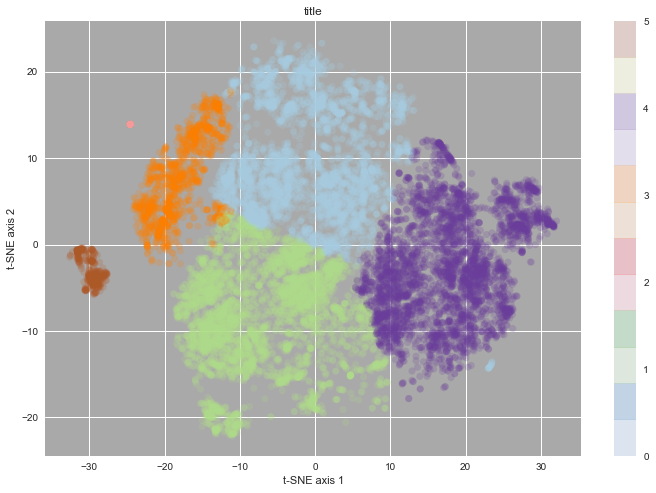

n_clusters =  7


array([2, 2, 2, ..., 2, 2, 1], dtype=int32)

silhouette =  0.20922559599
n_clusters = 7


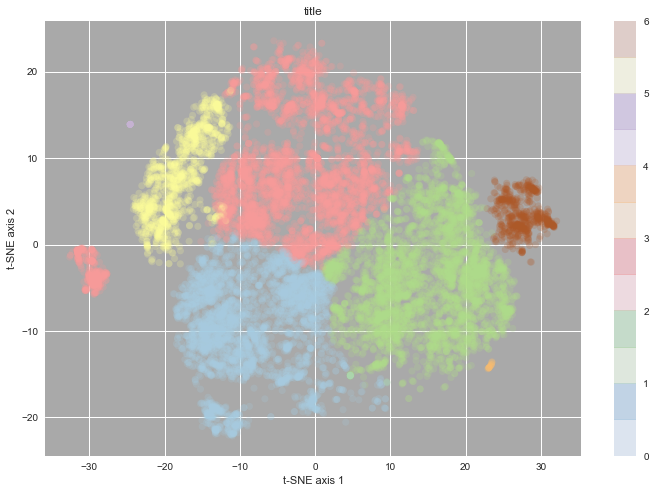

n_clusters =  8


array([5, 5, 3, ..., 5, 5, 2], dtype=int32)

silhouette =  0.27606835619
n_clusters = 8


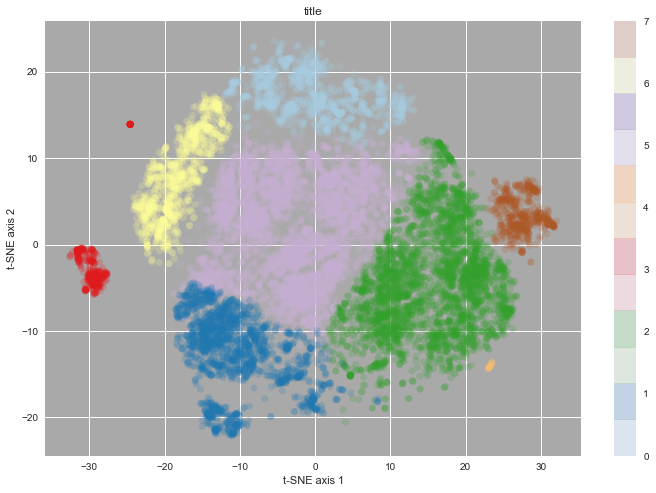

n_clusters =  9


array([2, 8, 2, ..., 2, 8, 2], dtype=int32)

silhouette =  0.179522097789
n_clusters = 9


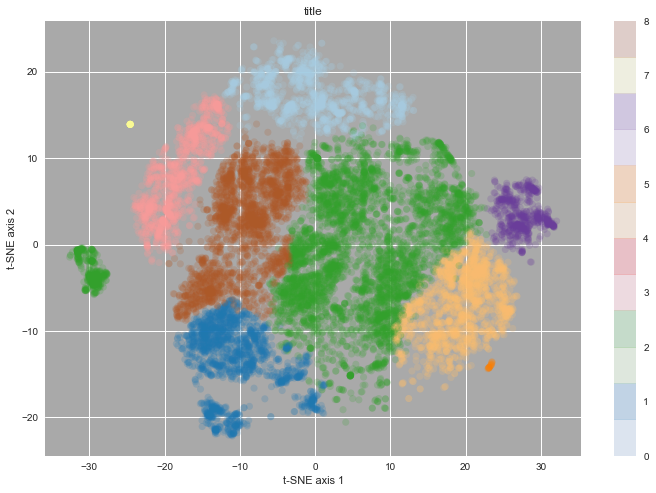

In [56]:
# ... spectraclustering on the t-sne vectors

X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = df_join['x-tsne']
X_tsne['t2'] = df_join['y-tsne']


from sklearn.cluster import SpectralClustering

# If a string, this may be one of 
#  ‘nearest_neighbors’, ‘precomputed’, ‘rbf’ 
#  or one of the kernels supported by sklearn.metrics.pairwise_kernels

for n_clstr in range(2, 10):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clstr)

    spc = SpectralClustering(n_clusters = n_clstr,
                             affinity = 'nearest_neighbors')
    spc_labels = spc.fit_predict(X_tsne) 
    spc_labels
    spc_silhouette = metrics.silhouette_score(X_tsne,
                                                 spc_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", spc_silhouette)
    
    toc =  time.clock()
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {
    'model_name' : 'spc - features',
    'n_clusters' : n_clstr,
    'inertia': 0,
    'silhouette': spc_silhouette, 
    'process_time' : exe_time
    }

    df_tbl = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    spc_tbl = spc_tbl.append(df_tbl)

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    _ = plt.figure(figsize=(12, 8));
    _ = plt.subplot(111, facecolor = 'darkgrey');
    
    X_tsne_values = X_tsne.values;
    _ = plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1],
                c = spc_labels,
                cmap = plt.cm.Paired,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    _ = plt.colorbar();
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    title = print('n_clusters =', n_clstr);
    _ = plt.title('title')
    _ = plt.grid(True);

    _ = plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - 
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-



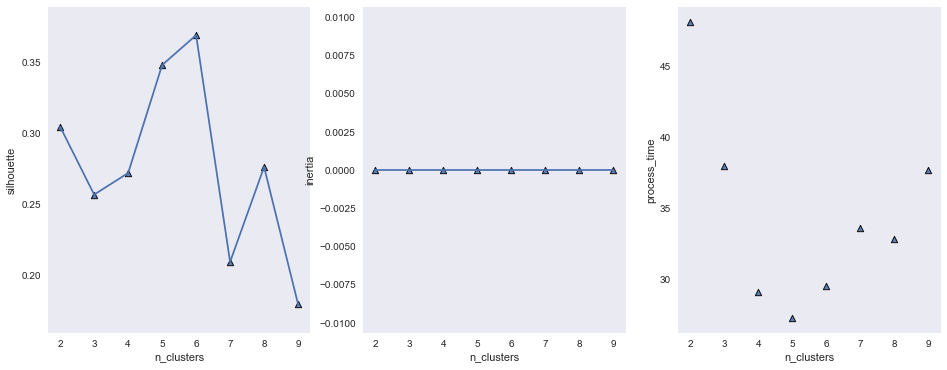

In [57]:

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - plot metrics across models for comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

plt.figure(figsize=(16, 6));

# ... silhouette values

plt.subplot(131);
plt.scatter(spc_tbl['n_clusters'],
            spc_tbl['silhouette'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(spc_tbl['n_clusters'],
         spc_tbl['silhouette'])

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
plt.grid();

# ... inertia values

plt.subplot(132);
plt.scatter(spc_tbl['n_clusters'],
            spc_tbl['inertia'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(spc_tbl['n_clusters'],
         spc_tbl['inertia'])

plt.xlabel('n_clusters'), plt.ylabel('inertia');
plt.grid();

# ... process time

plt.subplot(133);
plt.scatter(spc_tbl['n_clusters'],
            spc_tbl['process_time'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

#plt.plot(spc_tbl['n_clusters'],
#         spc_tbl['process_time'])

plt.xlabel('n_clusters'), plt.ylabel('process_time');
plt.grid();


plt.show();


### - choose spectral clustering with preferred number of clusters  


In [61]:

n_clusters_chosen = 6

for n_clstr in range(n_clusters_chosen, n_clusters_chosen+1):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clstr)

    spc = SpectralClustering(n_clusters = n_clstr,
                             affinity = 'nearest_neighbors')
    spc_labels = spc.fit_predict(X_tsne) 
    spc_labels
    spc_silhouette = metrics.silhouette_score(X_tsne,
                                                 spc_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", spc_silhouette)
    
    toc =  time.clock()



n_clusters =  6


/home/mcdevitt/anaconda3/lib/python3.6/site-packages/sklearn/manifold/spectral_embedding_.py:234: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


array([0, 2, 3, ..., 2, 2, 1], dtype=int32)

silhouette =  0.282105394158


In [62]:

X_all_together = copy.deepcopy(df_join)

len(X_all_together)

X_all_together['spc_labels'] = spc_labels

X_all_together.describe().T


13875

,count,mean,std,min,25%,50%,75%,max
x-tsne,13875.0,0.410117,14.157297,-32.599712,-10.773357,-0.665518,11.126032,32.072052
y-tsne,13875.0,0.040092,9.436279,-22.147314,-6.963444,-0.534287,6.482005,23.578930
sample_index,13875.0,20058.394739,11400.211047,0.000000,10224.000000,20189.000000,29834.500000,39642.000000
n_tokens_title,13875.0,-0.002783,0.997158,-3.972899,-0.661657,-0.188622,0.757447,4.068690
num_keywords,13875.0,-0.011052,0.997482,-3.260042,-0.641015,-0.117210,0.930401,1.454206
data_channel_is_lifestyle,13875.0,0.050739,0.219472,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_entertainment,13875.0,0.178739,0.383147,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_socmed,13875.0,0.057658,0.233103,0.000000,0.000000,0.000000,0.000000,1.000000
kw_avg_max,13875.0,0.021806,0.998054,-1.911764,-0.621457,-0.091469,0.551779,4.335148
is_weekend,13875.0,0.130450,0.336810,0.000000,0.000000,0.000000,0.000000,1.000000


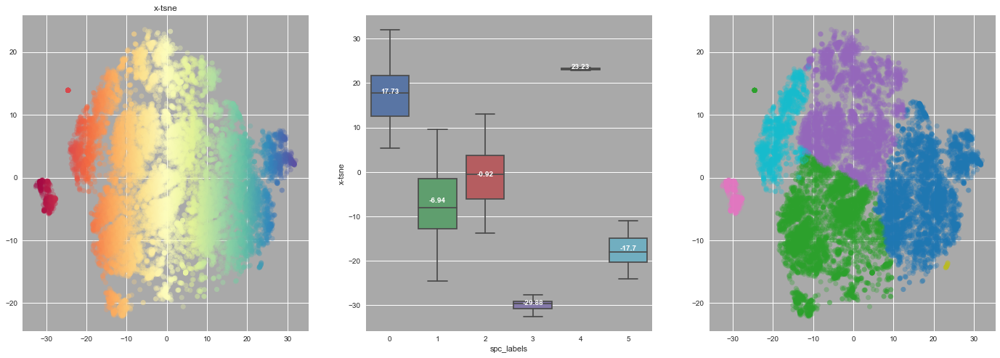

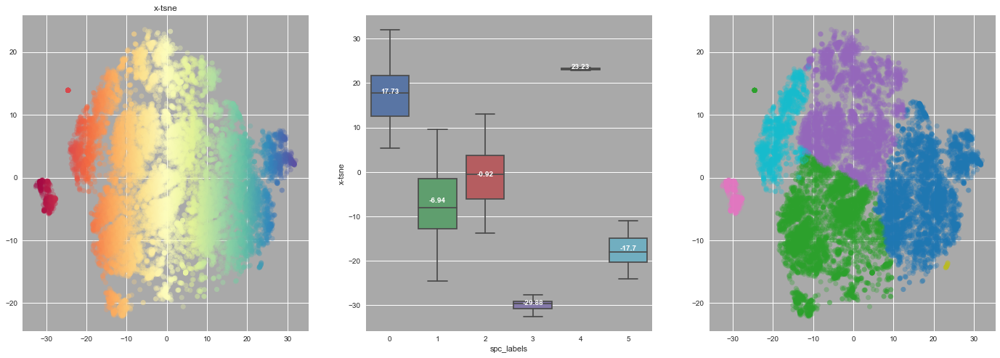

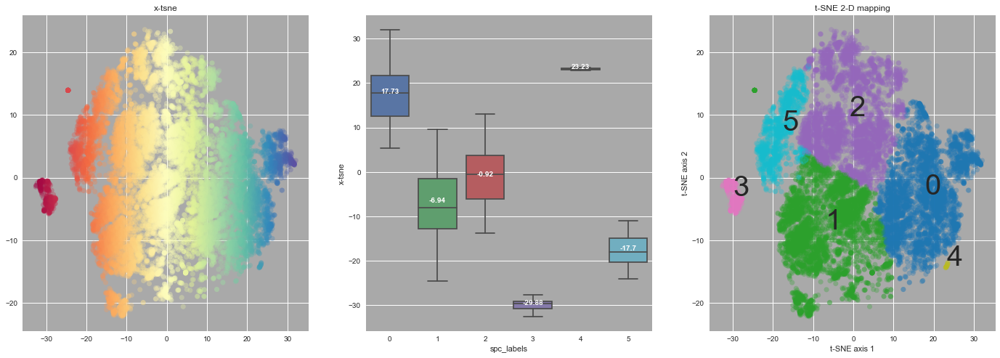

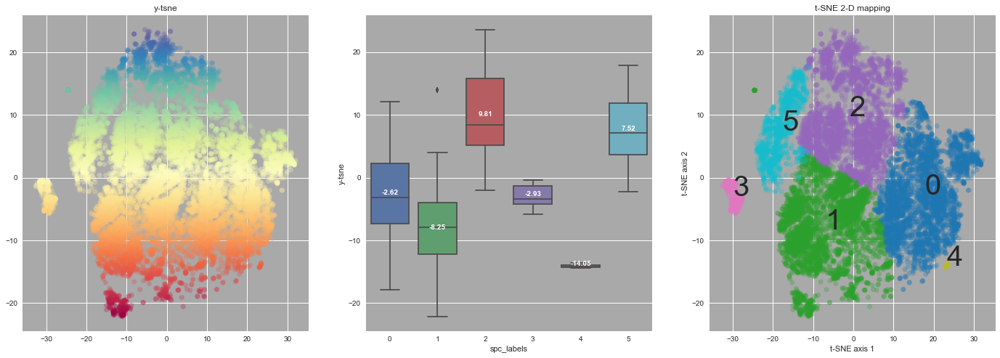

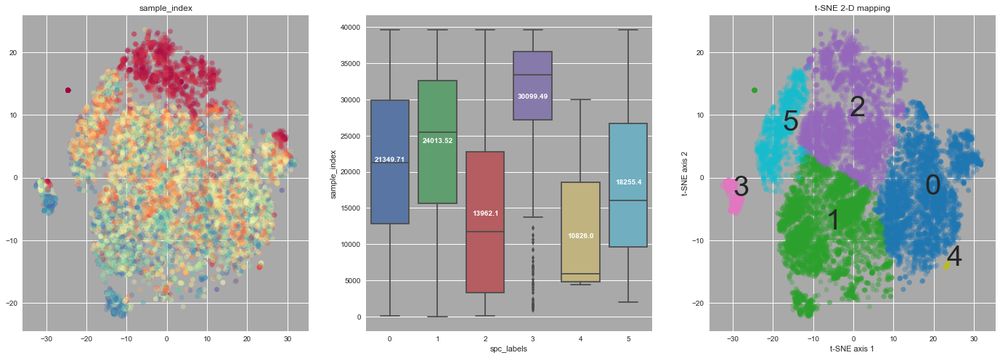

...

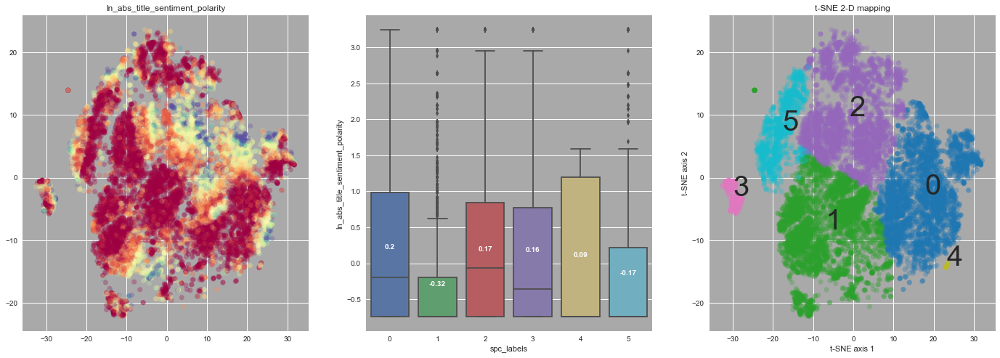

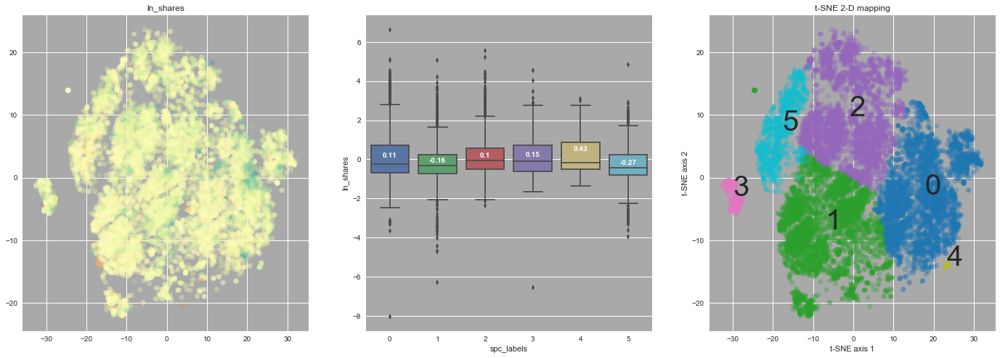

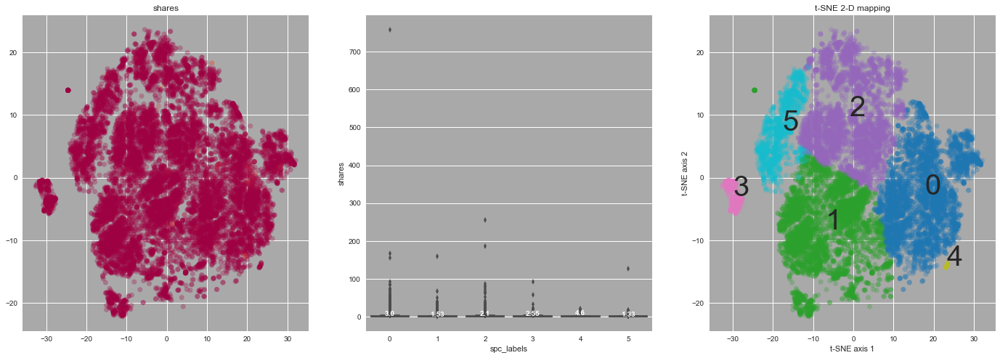

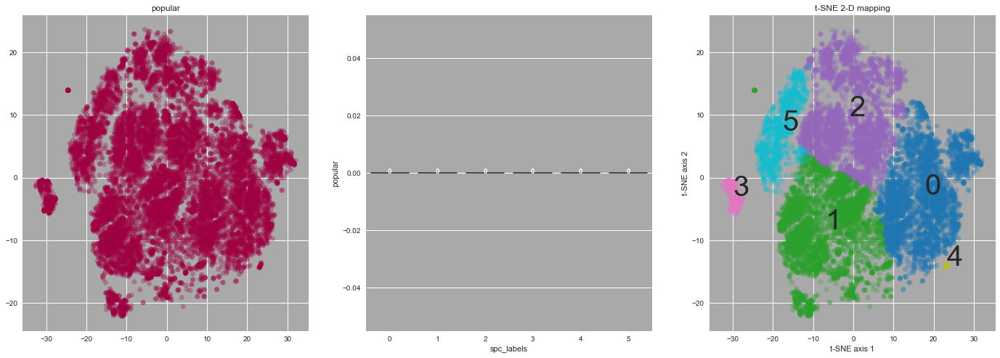

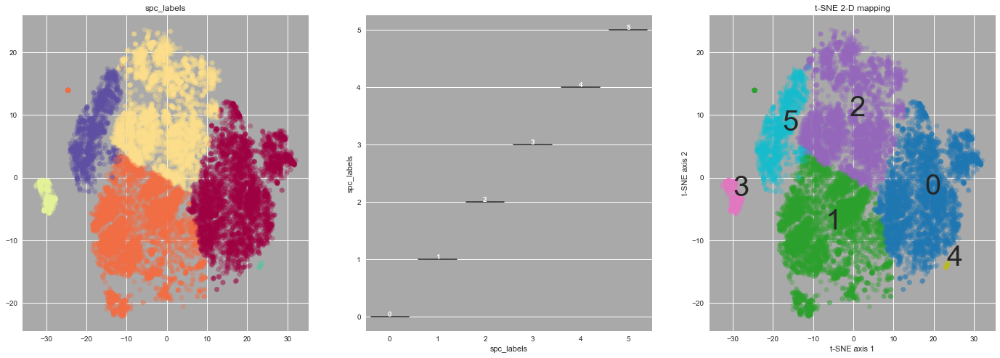

In [67]:
# boxplot across clusters for each feature ...
import seaborn as sns

spc_centers_x = X_all_together.groupby(['spc_labels'])['x-tsne'].mean()
spc_centers_y = X_all_together.groupby(['spc_labels'])['y-tsne'].mean()

col_names = X_all_together.columns.values.tolist()

for col in col_names :
    
    _ = plt.figure(figsize=(24, 8));
    
# ... feature distribution color map 

    _ = plt.subplot(131, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = X_all_together[col],
                 cmap = plt.cm.Spectral,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.title(col)
    
# ... feature boxplots

    _ = plt.subplot(132, facecolor = 'darkgrey');
    ax = sns.boxplot(x = "spc_labels", y = col, data = X_all_together);
    
    average_values = X_all_together.groupby(['spc_labels'])[col].mean().values
    average_labels = [str(np.round(s, 2)) for s in average_values]

    pos = range(len(average_values))
    for tick, label in zip(pos, ax.get_xticklabels()):
        
        _ = ax.text(pos[tick], average_values[tick], average_labels[tick], 
                horizontalalignment = 'center', size = 'small', color = 'w', weight = 'semibold')


# ... cluster color map
    
    _ = plt.subplot(133, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = spc_labels,
                 cmap = plt.cm.tab10,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    
    for ii in range(n_clusters_chosen) :                                      
          _ = plt.text(spc_centers_x[ii], spc_centers_y[ii], ii, fontsize = 40)
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    _ = plt.title('t-SNE 2-D mapping')
    
    plt.savefig("cluster_spctrl_3way_preplx_100_%s.png" %col)
 
    plt.show();
    

In [68]:

grouped = X_all_together.groupby(['spc_labels'])

#grouped.describe()

grouped.mean()
grouped.sum()
grouped.std()
grouped.sum() / grouped.mean()

X_all_together.mean()
X_all_together.std()


((grouped.mean() - X_all_together.mean()) / X_all_together.std()).T


,x-tsne,y-tsne,sample_index,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
spc_labels,,,,,,,,,,,,,,,,,,,,,
0,17.731234,-2.620412,21349.709104,0.119634,-0.025531,0.022152,0.475414,0.031159,0.376277,0.140458,...,0.588097,-0.509039,1.002072,-0.580665,0.303987,0.176174,0.204066,0.108631,3.002882,0.0
1,-6.937060,-8.249080,24013.519706,0.031274,-0.120443,0.040836,0.054368,0.048908,0.089772,0.119658,...,-0.269042,0.676300,-0.528589,0.270390,-0.044375,0.128947,-0.317750,-0.160322,1.525546,0.0
2,-0.923709,9.807215,13962.100104,-0.116425,0.058073,0.089444,0.052782,0.099064,-0.459662,0.139886,...,-0.193250,-0.323507,-0.397838,0.384167,-0.171367,-0.143773,0.171391,0.104838,2.097146,0.0
3,-29.875178,-2.926156,30099.492424,0.206768,0.105010,0.015152,0.171717,0.020202,0.929978,0.126263,...,-0.095593,-0.090584,1.019120,-0.557456,-1.553284,-1.481184,0.164901,0.147437,2.551335,0.0
4,23.233077,-14.051456,10826.000000,0.228761,0.344971,0.000000,0.529412,0.000000,-0.046953,0.117647,...,0.398488,-0.653127,1.203620,-0.561895,6.905318,-0.071242,0.088619,0.432864,4.603436,0.0
5,-17.702504,7.519392,18255.400463,-0.231327,0.145097,0.070216,0.013889,0.059414,-0.170465,0.107253,...,-0.385656,0.362260,-0.568570,0.006747,0.019874,-0.206256,-0.166888,-0.265546,1.331271,0.0


,x-tsne,y-tsne,sample_index,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
spc_labels,,,,,,,,,,,,,,,,,,,,,
0,72839.910957,-10764.651182,87704605,491.454436,-104.883040,91,1953,128,1545.746766,577,...,2415.903974,-2091.132439,4116.512447,-2385.371626,1248.779990,723.722690,838.302853,446.255785,12335.838681,0
1,-29218.896779,-34745.123209,101144945,131.725849,-507.307837,172,229,206,378.120802,504,...,-1133.205303,2848.573860,-2226.417424,1138.881733,-186.907354,543.124003,-1338.362331,-675.276895,6425.598542,0
2,-3552.584261,37718.547021,53698237,-447.768965,223.347414,344,203,381,-1767.861704,538,...,-743.240552,-1244.207954,-1530.085919,1477.507480,-659.075814,-552.950024,659.170596,403.207959,8065.623339,0
3,-11830.570395,-1158.757587,11919399,81.880141,41.584095,6,68,8,368.271399,50,...,-37.855011,-35.871160,403.571575,-220.752404,-615.100584,-586.548729,65.300923,58.384950,1010.328579,0
4,394.962307,-238.874756,184042,3.888945,5.864508,0,9,0,-0.798207,2,...,6.774295,-11.103162,20.461537,-9.552219,117.390398,-1.211119,1.506528,7.358694,78.258412,0
5,-22942.444825,9745.131660,23658999,-299.799190,188.045362,91,18,77,-220.922811,139,...,-499.810607,469.488458,-736.867207,8.744286,25.756795,-267.307595,-216.287267,-344.148061,1725.327438,0


,x-tsne,y-tsne,sample_index,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
spc_labels,,,,,,,,,,,,,,,,,,,,,
0,6.145579,5.950309,10246.931691,0.963262,0.941306,0.147195,0.499456,0.173768,0.930258,0.347504,...,1.333141,0.417962,1.027964,0.379257,1.131681,0.954743,1.104414,1.150624,13.950880,0.0
1,6.828502,6.052585,10150.326180,1.028105,1.010760,0.197933,0.226770,0.215701,0.828325,0.324600,...,0.651248,1.148350,0.392936,1.060276,0.862103,1.122921,0.787875,0.894118,3.974981,0.0
2,6.255839,6.043595,11537.568262,0.996150,1.032113,0.285420,0.223627,0.298787,1.056268,0.346913,...,0.746471,0.688102,0.617749,1.117841,0.764190,0.817294,1.038127,0.916110,6.693783,0.0
3,1.086183,1.581020,9509.598452,0.992340,0.867223,0.122310,0.377612,0.140869,1.282206,0.332565,...,0.897945,1.009561,1.103568,0.499362,0.000000,0.000000,1.115895,1.113068,6.363650,0.0
4,0.184556,0.261808,8212.754243,0.687170,0.690012,0.000000,0.514496,0.000000,1.073120,0.332106,...,1.217175,0.224578,0.889023,0.401800,2.874351,0.680941,0.993012,1.430721,7.333824,0.0
5,3.335324,4.776298,9947.787872,0.929713,1.022432,0.255609,0.117075,0.236488,0.690360,0.309554,...,0.405136,1.134882,0.321536,0.944815,0.789208,0.660760,0.861488,0.945646,3.867072,0.0


,x-tsne,y-tsne,sample_index,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
spc_labels,,,,,,,,,,,,,,,,,,,,,
0,4108.0,4108.0,4108.0,4108.0,4108.0,4108.0,4108.0,4108.0,4108.0,4108.0,...,4108.0,4108.0,4108.0,4108.0,4108.0,4108.0,4108.0,4108.0,4108.0,NaN
1,4212.0,4212.0,4212.0,4212.0,4212.0,4212.0,4212.0,4212.0,4212.0,4212.0,...,4212.0,4212.0,4212.0,4212.0,4212.0,4212.0,4212.0,4212.0,4212.0,NaN
2,3846.0,3846.0,3846.0,3846.0,3846.0,3846.0,3846.0,3846.0,3846.0,3846.0,...,3846.0,3846.0,3846.0,3846.0,3846.0,3846.0,3846.0,3846.0,3846.0,NaN
3,396.0,396.0,396.0,396.0,396.0,396.0,396.0,396.0,396.0,396.0,...,396.0,396.0,396.0,396.0,396.0,396.0,396.0,396.0,396.0,NaN
4,17.0,17.0,17.0,17.0,17.0,NaN,17.0,NaN,17.0,17.0,...,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,17.0,NaN
5,1296.0,1296.0,1296.0,1296.0,1296.0,1296.0,1296.0,1296.0,1296.0,1296.0,...,1296.0,1296.0,1296.0,1296.0,1296.0,1296.0,1296.0,1296.0,1296.0,NaN


x-tsne                                 0.410117
y-tsne                                 0.040092
sample_index                       20058.394739
n_tokens_title                        -0.002783
num_keywords                          -0.011052
data_channel_is_lifestyle              0.050739
data_channel_is_entertainment          0.178739
data_channel_is_socmed                 0.057658
kw_avg_max                             0.021806
is_weekend                             0.130450
global_subjectivity                    0.002958
global_rate_positive_words             0.011095
rate_positive_words                    0.013677
max_positive_polarity                  0.011449
min_negative_polarity                  0.003018
max_negative_polarity                 -0.000837
title_sentiment_polarity               0.004485
abs_title_subjectivity                 0.003747
ln_n_tokens_content                    0.009432
ln_num_hrefs                           0.012760
ln_num_imgs                            0

x-tsne                                14.157297
y-tsne                                 9.436279
sample_index                       11400.211047
n_tokens_title                         0.997158
num_keywords                           0.997482
data_channel_is_lifestyle              0.219472
data_channel_is_entertainment          0.383147
data_channel_is_socmed                 0.233103
kw_avg_max                             0.998054
is_weekend                             0.336810
global_subjectivity                    0.988828
global_rate_positive_words             0.999152
rate_positive_words                    0.989198
max_positive_polarity                  0.992793
min_negative_polarity                  0.997388
max_negative_polarity                  1.009672
title_sentiment_polarity               1.003665
abs_title_subjectivity                 0.998231
ln_n_tokens_content                    0.985424
ln_num_hrefs                           0.999294
ln_num_imgs                            1

spc_labels,0,1,2,3,4,5
abs_title_subjectivity,-0.074964,0.298771,-0.273397,-0.028053,0.154632,0.084485
data_channel_is_entertainment,0.774311,-0.324602,-0.328742,-0.018326,0.915244,-0.430252
data_channel_is_lifestyle,-0.130253,-0.045122,0.176355,-0.162150,-0.231186,0.088746
data_channel_is_socmed,-0.113679,-0.037536,0.177631,-0.160683,-0.247348,0.007533
global_rate_positive_words,0.123457,-0.354731,0.421302,-2.286608,-1.396908,0.228307
global_subjectivity,0.421003,-0.151050,0.101271,-3.845701,0.475931,0.024738
is_weekend,0.029712,-0.032043,0.028013,-0.012434,-0.038014,-0.068874
kw_avg_max,0.355163,0.068099,-0.482407,0.909943,-0.068893,-0.192646
ln_LDA_00,-0.437905,-0.190771,0.532755,-0.393350,-0.343406,0.551752
ln_LDA_01,0.587971,-0.269885,-0.194030,-0.096291,0.398203,-0.386597


<a href='#toc'> Table of Contents</a>

<a name='end_of_file'></a>
<font color="blue" size=3>  end of file